## [Lecture 7.2: Softmax Regression](https://www.youtube.com/watch?v=jQiGzIllLsk)

### **Softmax Regression**
- Softmax Regression is a **classification** method, which **generalizes Logistic Regression**.
- It is used for **multi-class classification**.

Working of softmax regression is depicted in the following figure:
- For $k$ **class-labels**, the input feature vector goes through $k$ **different linear combinations**, one per each label.
- These $k$ values are passed through **softmax activation**, which returns the **probability vector** containing $k$ components.
  - The $i$*-th component denotes **probability** of an input sample belonging to class label $i$.

The softmax classifier is trained with a **categorical cross-entropy** loss, which is computed based on the actual labels and predicted labels.

Note that the labels are represented with **one-hot-encoding**.
<img src="images/Softmax-regression.png"/>

As usual we will list down five components of the softmax regression classifier:
- Training data
- Model
- Loss Function
- Optimization procedure
- Model evaluation

In [1]:
import numpy as np
from keras.datasets import mnist
import matplotlib.pyplot as plt

### Training data
The training data contains:
- Feature matrix
- Label (one of the $k$ labels)

For the purpose of this illustration, we will be using **MNIST handwritten digits** dataset.
- Each input is in this form of a $28 \times 28$ image of a single handwritten digit.
- Each image is labelled with a digit present in it, there are 10 digits in all and hence 10 total classes: [0, 1, 2, ...., 9]

Let's load the dataset and quickly examine it.

In [2]:
(train_X, train_y), (test_X, test_y) = mnist.load_data()

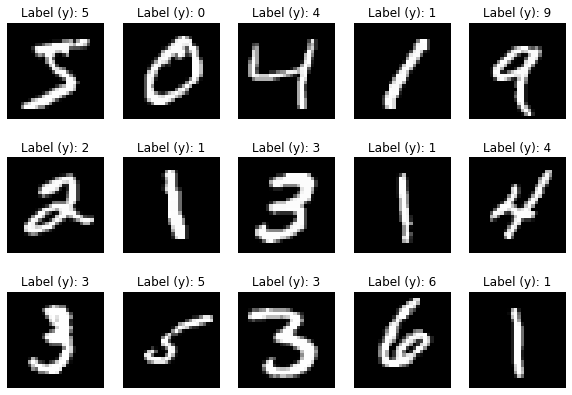

In [3]:
# Plotting some data examples
fig = plt.figure(figsize=(10, 7))
for i in range(15):
    ax = fig.add_subplot(3, 5, i+1)
    ax.imshow(train_X[i], cmap=plt.get_cmap('gray'))
    ax.set_title('Label (y): {y}'.format(y=train_y[i]))
    plt.axis('off')

Observe that
- Each image is grayscale image with size $28 \times 28$ pixels.

We flatten each input image into a vector of length 784 ($28 \times 28$) and these 784 numbers represent intensity at each pixel in an image.

In [4]:
X_train = train_X.reshape(train_X.shape[0], 28*28)
X_test = test_X.reshape(test_X.shape[0], 28*28)

Each pixel takes values between 0 and 255. We scale each value by dividing it with 255

In [5]:
# Normalizing
X_train = X_train/255
X_test = X_test/255

**Important Step**:
> For softmax regression, the label vector $\mathbf{y}$ needs to represented in **one-hot encoding**.

In [6]:
def convert_to_one_hot_encoding(y ,k):
    # A zero matrix of size (n, k)
    y_one_hot = np.zeros((len(y), k))

    # Putting 1 for column where the label is using multidimensional indexing.
    y_one_hot[np.arange(len(y)), y] = 1
    return y_one_hot

In the following figure, the total number of classes are denoted by $c$.

### Model
<img src="images/softmax-model.png" />

The **Softmax regression** has two stages:
1. **Linear combination** (in vectorized form):


$$
\mathbf{Z}_{n \times k} = \mathbf{X}_{n \times m}\mathbf{W}_{m \times k} + \mathbf{b}_{k \times 1}
$$
2. **Softmax non-linear transformation: (in vectorized form)
$$
\text{softmax}(\mathbf{Z}) = \frac{\text{exp}(\mathbf{Z})}{\sum \text{exp}(\mathbf{Z})}
$$

Softmax classifier provides a **probability** of an example belonging to a class:
$$
p(y = q |\mathbf{x}; \mathbf{W}, \mathbf{b}) = \frac{\text{exp}(\mathbf{z}_q)}{\sum_k \text{exp}(\mathbf{z}_k)}
$$

### Softmax Regression implementation

**Step 1**: In vectorized form  we implement $\mathbf{Z} = \mathbf{XW} + \mathbf{b}$
Each class has $m+1$ parameters, one bias and $m$ weights corresponding to $m$ features.

In [7]:
def linear_combination(X, w, b):
    return X @ w + b

**Step 2**: Calculate the softmax for each class using the above formula.
> - The sum of softmax across all classes for a given sample is 1.
> - The class label with the highest value of softmax is assigned to the sample.

**Note**: Every class has a different set of weights and a bias.

In [8]:
def softmax(z):
    # z ---> linear part
    # subtracting the max of z for numerical stability.
    exp = np.exp(z - np.max(z))

    # Calculating softmax for all examples.
    for i in range(len(z)):
        exp[i] /= np.sum(exp[i])

    return exp

### Loss function: Categorical Cross Entropy loss
For softmax regression, we use the **cross entropy** (CE) loss.

For any pair of label vectors $\mathbf{y}_k$ and model prediction $\hat{\mathbf{y}}_k$ over $k$ classes, the loss function $J$ is given as 
$$
J(\mathbf{W, b})= -\sum_k \mathbf{y}_k \log(\hat{\mathbf{y}}_k)
$$

### Optimization
The objective here is to estimate the weight matrix $\mathbf{W}_{m \times k}$ and $\mathbf{b}$ by optimizing  the loss $J(\mathbf{W, b})$

There are 
- $m \times k$ entries in the weight matrix $\mathbf{W}$.
- $k$ entries in bias vector $\mathbf{b}$.

We calculate the partial derivative of loss function with respect to each weight $\mathbf{W}[j,i]$ and the bias unit $\mathbf{b}[i]$.
- $\mathbf{W}[j,i]$ represents weight of $j$-th feature in the $i$-th linear combination:  $\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{W}[j,i]}$.
- $\mathbf{b}[i]$ represents bias for $i$-th linear combination: $\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{b}[i]}$

Note that the softmax is a two stage process:
- [Linear combination] $\mathbf{z = xW+b}$
- [Non-linear transformation] $\text{softmax}(\mathbf{z}) = \text{softmax}(\mathbf{xW+b})$

> The weights $\mathbf{W}[j, i]$ and $\mathbf{b}[i]$ are used for calculating $\mathbf{z}[i]$:
> $$\begin{align}
    \mathbf{z}[i] &= \mathbf{b}[i] + \mathbf{x}[1]\mathbf{W}[1, i] + \mathbf{x}[2]\mathbf{W}[2, i]+...+\mathbf{x}[m]\mathbf{W}[m, i] \\
    &= \mathbf{b}[i] + \sum_{j=1}^m \mathbf{x}[j]\mathbf{W}[j,i]
\end{align}
$$
And $\mathbf{z}[i]$ is used for softmax calculation in numerator for $i$-th class and in denominators of all classes.
> $$\text{softmax}(\mathbf{z}[i]) = \frac{\text{exp}(\mathbf{z}[i])}{\sum_k \exp (\mathbf{z}[i, k])}$$
The loss is computed based on the output of the softmax . Hence the loss and weights are not directly related, but are related through $\mathbf{z}$.

We need to make use of chain rule of calculus to calculate the derivatives.
$$\begin{align}
    \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{W}[j,i]} &= \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{z}[i]} \frac{\partial \mathbf{z}[i]}{\partial \mathbf{W}[j,i]}\\
    \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{b}[i]} &= \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{z}[i]} \frac{\partial \mathbf{z}[i]}{\partial \mathbf{b}[i]}\\
\end{align}
$$
Let's calculate the partial derivatives one by one.
#### Calculate : $\frac{\partial \mathbf{z}[i]}{\partial \mathbf{W}[j,i]}$
$$
\tag{3}
\frac{\partial \mathbf{z}[i]}{\partial \mathbf{W}[j,i]} = \frac{\partial}{\partial \mathbf{W}[j,i]}(\mathbf{b}[i] + \sum_{j=1}^m \mathbf{x}[j]\mathbf{W}[j,i]) = \mathbf{x}[j]
$$
#### Calculate : $\frac{\partial \mathbf{z}[i]}{\partial \mathbf{b}[i]}$
$$
\tag{4}
\frac{\partial \mathbf{z}[i]}{\partial \mathbf{b}[i]} = \frac{\partial}{\partial \mathbf{b}[i]}(\mathbf{b}[i] + \sum_{j=1}^m \mathbf{x}[j]\mathbf{W}[j,i]) = 1
$$
#### Calculate :  $\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{z}[i]}$
> - Note that $\mathbf{z}$ is related loss through prediction $\hat{\mathbf{y}}$. Using chain rule one more time for this equation.
> Moreover $\mathbf{z}[i]$ is used in calculation of $\hat{\mathbf{y}}[i]$ and $\hat{\mathbf{y}}[j]$, where $j \ne i$. Hence making use of addition.

$$
  \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{z}[i]} =   \frac{\partial J(\mathbf{W, b})}{\partial \hat{\mathbf{y}}[i]} \frac{\partial \hat{\mathbf{y}}[i]}{\partial \mathbf{z}[i]} + \sum_{j \ne i} \frac{\partial J(\mathbf{W, b})}{\partial \hat{\mathbf{y}}[j]} \frac{\partial \hat{\mathbf{y}}[j]}{\partial \mathbf{z}[i]}
$$
#### Calculate : $\frac{\partial J(\mathbf{W, b})}{\partial \hat{\mathbf{y}}[i]}$
$$
\tag{5}
\frac{\partial J(\mathbf{W, b})}{\partial \hat{\mathbf{y}}[i]} = \frac{\partial}{\partial \hat{\mathbf{y}}[i]} \left(-\sum_k \mathbf{y}[k]\log \hat{\mathbf{y}}[k] \right) = \frac{\mathbf{y}[i]}{\hat{\mathbf{y}}[i]}
$$
Hence
$$
\tag{6}
\frac{\partial J(\mathbf{W, b})}{\partial \hat{\mathbf{y}}[i]} = \frac{\mathbf{y}[i]}{\hat{\mathbf{y}}[i]}
$$
#### Calculate $\frac{\partial \hat{\mathbf{y}}[i]}{\partial \mathbf{z}[i]}$
$$
\begin{align}
  \frac{\partial \hat{\mathbf{y}}[i]}{\partial \mathbf{z}[i]} &= \frac{\partial}{\partial \mathbf{z}[i]} \frac{e^{\mathbf{z}[i]}}{\sum_k e^{\mathbf{z}[k]}} \\
  & \text{Using quotient rule of derivative} \\
  &= \frac{\sum_k e^{\mathbf{z}[k]}\frac{\partial}{\partial \mathbf{z}[i]}e^{\mathbf{z}[i]} - e^{\mathbf{z}[i]}\frac{\partial}{\partial \mathbf{z}[i]}\sum_k e^{\mathbf{z}[i]}}{(\sum_k e^{\mathbf{z}[k]})^2} \\
  &= \frac{e^{\mathbf{z}[i]}\sum_k e^{\mathbf{z}[k]} - e^{\mathbf{z}[i]} e^{\mathbf{z}[i]}}{(\sum_k e^{\mathbf{z}[k]})^2} \\
  & \text{simplifying with alzebraic manipulation} \\
  &= \underbrace{\frac{e^{\mathbf{z}[i]}}{\sum_k e^{\mathbf{z}[k]}}}_{\hat{\mathbf{y}}[i]} - \underbrace{\left(\frac{e^{\mathbf{z}[i]}}{\sum_k e^{\mathbf{z}[k]}} \right)^2}_{\hat{\mathbf{y}}[i]^2} \\
  &= \textcolor{blue}{\hat{\mathbf{y}}[i] - \hat{\mathbf{y}}[i]^2} \tag{7}
\end{align}
$$
#### Calculate $\frac{\partial \hat{\mathbf{y}}[j]}{\partial \mathbf{z}[i]}; j \ne i$
$$
\begin{align}
  \frac{\partial \hat{\mathbf{y}}[j]}{\partial \mathbf{z}[i]} &= \frac{\partial}{\partial \mathbf{z}[i]} \frac{e^{\mathbf{z}[j]}}{\sum_k e^{\mathbf{z}[k]}} \\
  & \text{Using quotient rule of derivative} \\
  &= \frac{\sum_k e^{\mathbf{z}[k]}\frac{\partial}{\partial \mathbf{z}[i]}e^{\mathbf{z}[j]} - e^{\mathbf{z}[j]}\frac{\partial}{\partial \mathbf{z}[i]}\sum_k e^{\mathbf{z}[j]}}{(\sum_k e^{\mathbf{z}[k]})^2} \\
  &= \frac{e^{\mathbf{z}[i]}\textcolor{blue}{0} - e^{\mathbf{z}[j]} \textcolor{blue}{e^{\mathbf{z}[i]}}}{(\sum_k e^{\mathbf{z}[k]})^2} \\
  &= - \textcolor{blue}{\hat{\mathbf{y}}[j]\hat{\mathbf{y}}[i]} \tag{8}
\end{align}
$$
Replacing these two partial derivative terms in the equation we get:
$$
\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{z}[i]} = \hat{\mathbf{y}}[i] - \mathbf{y}[i] \tag{4}
$$
Subsituting the equations we get:
$$
\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{W}[j,i]} = \mathbf{x}[j](\hat{\mathbf{y}}[i] - \mathbf{y}[i])
$$

### Partial derivatives in vectorized form
The **partial derivative** of the loss function are:
$$
\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{W}} = \mathbf{X}^T(\mathbf{\hat{Y} - Y})
$$
$$
\frac{\partial J(\mathbf{W, b})}{\partial \mathbf{b}} = \mathbf{\hat{Y} - Y}
$$

### Weight update rule
Hence the update rule for weight parameters are:
$$
\mathbf{W}_{t+1} \leftarrow \mathbf{W}_t - \alpha \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{W}}
$$
$$
\mathbf{b}_{t+1} \leftarrow \mathbf{b}_t - \alpha \frac{\partial J(\mathbf{W, b})}{\partial \mathbf{b}}
$$

### **Training**
1. Initialize parameters: `w` and `b`.
2. Find the optimal `w` and `b` using Gradient descent
3. Use `softmax(w.X + b)` to predict.

In [9]:
def fit(X, y, lr, c, epochs):
    # X -----> Input
    # y -----> true/target value.
    # lr ----> Learning rate.
    # c -----> Number of classes.
    # epochs->  Number of iterations
    
    # n -----> Number of examples
    # m -----> Number of features
    n, m = X.shape

    # Initializing weights and bias randomly.
    w = np.random.random((m, c))
    b = np.random.random(c)

    # Empty list to store losses
    losses = []
    # training loop.
    for epoch in range(epochs):

        # Calculating hypothesis/prediction
        z = X @ w + b
        y_hat = softmax(z)

        # One hot encoding of y.
        y_hot = convert_to_one_hot_encoding(y, c)

        # Calculating the gradient of loss w.r.t w and b.
        w_grad = (1/n)* np.dot(X.T, (y_hat - y_hot))
        b_grad = (1/n) * np.sum(y_hat - y_hot)

        # Updating the parameters
        w = w - lr * w_grad
        b = b - lr * b_grad

        # Calculating loss and appending it to the list
        loss =  - np.mean(np.log(y_hat[np.arange(len(y)), y]))
        losses.append(loss)

        # Printing out loss at every 10th iteration.
        if epoch%10 == 0:
            print('Epoch {epoch} ==> Loss = {loss}'.format(epoch=epoch, loss=loss))
    
    return w, b, losses

def predict(X, w, b):
    # X -----> Input
    # w -----> weights
    # b -----> bias

    # Predict y
    z = X @ w + b
    y_hat = softmax(z)

    # Returning the class with highest probability
    return np.argmax(y_hat, axis=1)

def accuracy(y, y_hat):
    return np.sum(y == y_hat)/len(y)

### Training digit recognizer with MNIST dataset

In [10]:
w, b, l = fit(X_train, train_y, lr=0.9, c=10, epochs=100)

Epoch 0 ==> Loss = 5.1640461363124555
Epoch 10 ==> Loss = 0.9959306758507425
Epoch 20 ==> Loss = 0.6721542628862197
Epoch 30 ==> Loss = 0.5705251744678128
Epoch 40 ==> Loss = 0.5208148368645757
Epoch 50 ==> Loss = 0.48777269229563497
Epoch 60 ==> Loss = 0.4638058097191996
Epoch 70 ==> Loss = 0.4454364301257767
Epoch 80 ==> Loss = 0.43080006057145676
Epoch 90 ==> Loss = 0.4187970370695014


### Learning curve

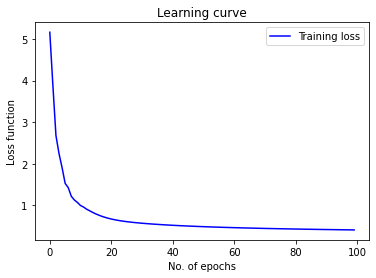

In [11]:
plt.figure()
plt.plot(np.arange(len(l)), l, 'b-')
plt.title('Learning curve')
plt.legend(['Training loss'])
plt.xlabel('No. of epochs')
plt.ylabel('Loss function')
plt.show()

In [12]:
# Accuracy for training set.
train_preds = predict(X_train, w, b)
print('Accuracy for training set: ', accuracy(train_y, train_preds))

Accuracy for training set:  0.8786333333333334


### Evaluate performace of classifier

In [13]:
# Accuracy for testing set.
test_preds = predict(X_test, w, b)
print('Accuracy for training set: ', accuracy(test_y, test_preds))

Accuracy for training set:  0.8839


### Confusion Matrix

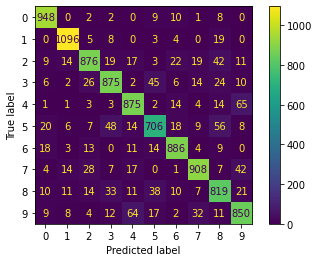

In [14]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(test_y, test_preds)
cm_disp = ConfusionMatrixDisplay(cm)
cm_disp.plot()

`classification_report` prints precison, recall and f1-score for each class.

In [15]:
from sklearn.metrics import  classification_report
print(classification_report(test_y, test_preds))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95       980
           1       0.95      0.97      0.96      1135
           2       0.90      0.85      0.87      1032
           3       0.87      0.87      0.87      1010
           4       0.87      0.89      0.88       982
           5       0.84      0.79      0.82       892
           6       0.91      0.92      0.92       958
           7       0.91      0.88      0.90      1028
           8       0.81      0.84      0.83       974
           9       0.84      0.84      0.84      1009

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



Alternatively we can also obtain `micro` and `macro` averaged precision, recall and F1-scores

In [16]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

print('F1 score %f'%f1_score(test_y, test_preds, average='micro'))
print('Precision score %f'%precision_score(test_y, test_preds, average='micro'))
print('Recall score %f'%recall_score(test_y, test_preds, average='micro'))

F1 score 0.883900
Precision score 0.883900
Recall score 0.883900


In [17]:
print('F1 score %f'%f1_score(test_y, test_preds, average='macro'))
print('Precision score %f'%precision_score(test_y, test_preds, average='macro'))
print('Recall score %f'%recall_score(test_y, test_preds, average='macro'))

F1 score 0.882012
Precision score 0.882358
Recall score 0.882207


### Plotting predictions

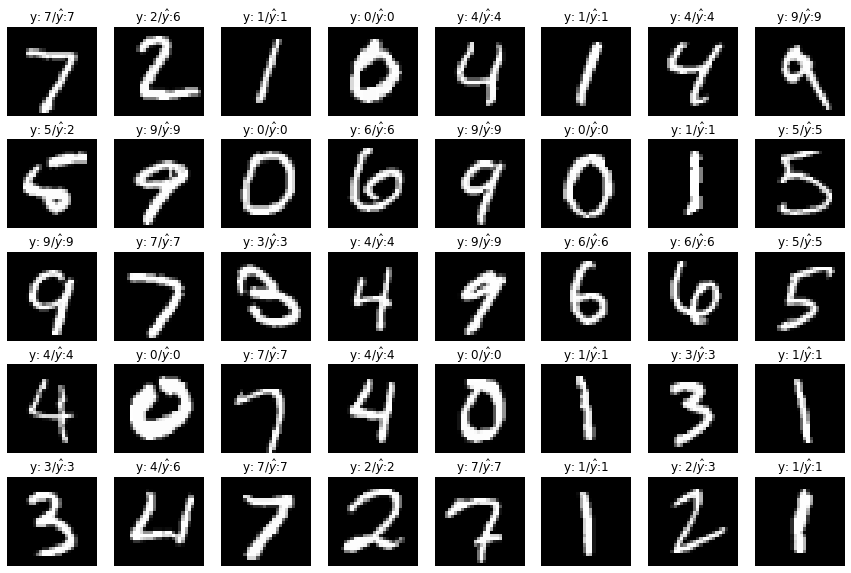

In [18]:
fig = plt.figure(figsize=(15, 10))
for i in range(40):
    ax = fig.add_subplot(5, 8, i+1)
    ax.imshow(test_X[i], cmap=plt.get_cmap('gray'))
    ax.set_title(f'y: ${test_y[i]}$/'+'$\hat{y}$:'+f'{test_preds[i]}')
    plt.axis('off')

## [Lecture 7.4: K-Nearest Neighbours](https://www.youtube.com/watch?v=ygUY9b8a1hE)

### K Nearest Neighbours (k-NN)
k-NN does not have a model. It stores all the examples in the training set.

For a given value of $k$ and selected distance metric, k-NN uses the following steps to assign label to the new example:
1. Find the distance between the new example to all the other examples in the training set.
2. Select the $k$ nearest examples and get their labels.

k-NN technique can be used in both **classification** and **regression** problems
> - For classification task, **assign the label taken by the majority of $k$ nearest neighbours**.
> - For regression task, **take the average of the output level and assign it to the new example**.

In this notebook, we will Implement k-NN from scratch.
> - **distance calculation** and
> - **nearest neighbour** based label or output assignment.

Let's begin by importing required libraries.

In [19]:
# necessary imports
from IPython.display import display, Math, Latex

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.datasets import make_classification, make_blobs
from sklearn.model_selection import train_test_split

plt.style.use('seaborn')

### Distance computation

We will implement distance computation between two examples:

In [20]:
def EuclideanDistance(x1, x2):
    '''
    Parameters
    ----------
    x1 and x2 : two row vectors, i.e numpy arrays
        x1 can have multiple rows, in that case this function returns
        euclidean distance between every row in x1 from x2

    Returns
    -------
    dist : a vector of euclidean distances between every row vector in x1
        from x2
    '''
    dist = np.sqrt(np.sum((x1 - x2)**2, axis=1))
    return dist

def ManhattanDistance(x1, x2):
    '''
    Parameters
    ----------
    x1 and x2 : two row vectors , i.e numpy arrays
        x1 can have multiple rows, in that case this function returns
        manhattan distance between every row in x1 from x2
    
    Returns
    -------
    dist : a vector of manhattan distances between every row vector in x1
        from x2
    '''
    dist = np.sum(np.abs(x1 - x2), axis=1)
    return dist

In the next two sections, we will implement classification and regression with k-NN

### KNN implementation
Let's implement KNN class

In [21]:
# for computing mode for classification task
class KNN:
    def __init__(self, k, distance_metric=EuclideanDistance, task_type="Classification"):
        '''
        Paramters
        ---------
        newExample: example for which prediction has to be made
        k :  number of nearest neighbours used to make prediction
        distance_metric : function used to calculate distance metric
        task_type : classification or regression
        '''

        # 1. Set k to the desired value,
        # i.e how many neighbours should be allowed to participate in prediction
        self._k = k
        self._distance_metric = distance_metric
        self._task_type = task_type
    

    def fit(self, X, y):
        '''
        Paramaters
        ----------
        X : A matrix of input examples
        y : A column vector of corresponding labels
        '''
        
        # Fitting the model on data only requires copying the data.

        self._X = X
        self._y = y
    
    def predict(self, newExample):
        '''
        Parameters
        ----------
        newExample : example for which prediction has to be made
        k : number of nearest neighbours used to make the prediction
        distance_metric : function used to calculate distance metric
        task_type : classification or regression

        Returns
        -------
        label : predicted label for newExample
        k_nearest_neighbours_indices : indices of the nearest k neighbours
        '''
        # 2. Calculate the distance between the new example  and every example
        # from the data . Thus create a distance vector.
        distance_vector = self._distance_metric(self._X, newExample)

        # 3. Get indices of nearest k neighbours
        k_nearest_neighbours_indices = np.argpartition(distance_vector, self._k)[:self._k]

        # 4. Get the labels of the selected k entries
        k_nearest_neighbours = self._y[k_nearest_neighbours_indices]

        # 5. If it is a classification task, return the majority class by computing
        # mode of the k labels
        if self._task_type == 'Classification':
            label = stats.mode(k_nearest_neighbours)[0]
        
        # If the task is regression then return
        # the average of the labels of nearest neighbours
        else:
            label = k_nearest_neighbours.mean()
        
        return label, k_nearest_neighbours_indices
    
    def eval(self, X_test, y_test):
        '''
        Parameters
        ----------

        X_test, y_test : test set

        Returns
        -------
        Misclassification error
        OR
        Root Mean Squared error
        '''

        # compute labels for test data and compute its corresponding error

        if self._task_type == 'Classification':
            y_predicted = np.zeros(y_test.shape)
            for i in range(y_test.shape[0]):
                y_predicted[i] = self.predict(X_test[i,:])

            error = np.mean(y_test == y_predicted, axis=0)
        else:
            y_predicted = np.zeros(y_test.shape)
            for i in range(y_test.shape[0]):
                y_predicted[i] = self.predict(X_test[i,:])
            
            error_vector = y_predicted - y_test
            error = np.sqrt((error_vector.T @ error_vector)/error_vector.ravel().shape[0])
            
        return error

### Classification

#### Example 1: Simple Decision Boundary
Let's generate 100 points, each represented two features and a class label. This data is represented for **classification task**.
> The points are generated such that they are clustered in two groups with means [0, 0] and [5, 5] with standard devation of 1.

In [22]:
# generate artificial data points
X, y = make_blobs(n_samples=100,
                  n_features=2,
                  centers=[[0,0],[5,5]],
                  cluster_std=1,
                  random_state=12)

Let's check the shapes of feature matrix and label vector.

In [23]:
print('Shape of feature matrix:', X.shape)
print('Shape of label vector:', y.shape)

Shape of feature matrix: (100, 2)
Shape of label vector: (100,)


Let's visualize these points:

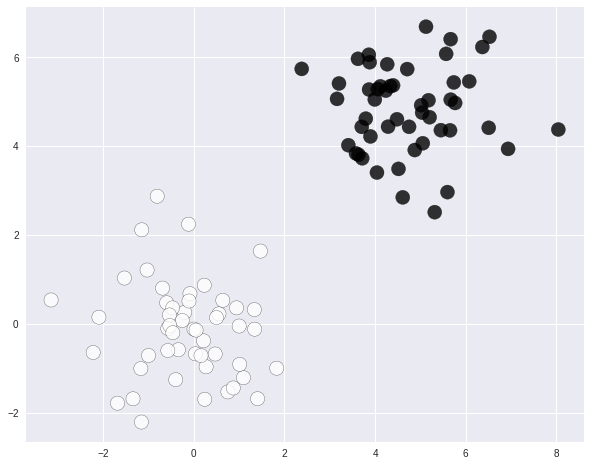

In [24]:
# plot the two classes
plt.figure(figsize=(10, 8))
plt.grid(True)
plt.scatter(X[:,0], X[:, 1], marker='o', c=y,
            s=200, edgecolor='k', alpha=0.8)
plt.show()

Let's apply KNN technique and visualize how a new example is assigned a label. For this example value of $k$ is set to be 3.

In [25]:
newExample = np.array([2.2, 2.2])

# Initialize the model with k=3 and euclidean distance as distance metric
model = KNN(3, distance_metric=EuclideanDistance)

model.fit(X, y)

# get the predicted label and the indices of nearest k neighbours
prediction, nearest_neighbours_indices = model.predict(newExample.reshape(1, 2))

Let's visualize the new example along with training examples

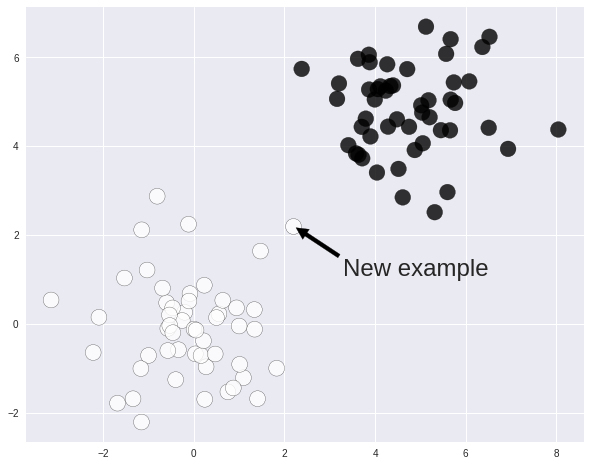

In [26]:
plt.figure(figsize=(10,8))
plt.grid(True)
plt.scatter(X[:,0], X[:, 1], marker='o', c=y,
            s=250, edgecolor='k', alpha=0.8)
plt.scatter(newExample[0], newExample[1], marker='o', c='white',
            s=250, edgecolor='k', alpha=0.8)
plt.annotate('New example', xy=newExample,
             xytext=(50, -50), textcoords='offset points',
             arrowprops=dict(facecolor='black', shrink=0.05), fontsize=24)
plt.show()        

Find the nearest 2 neighbours

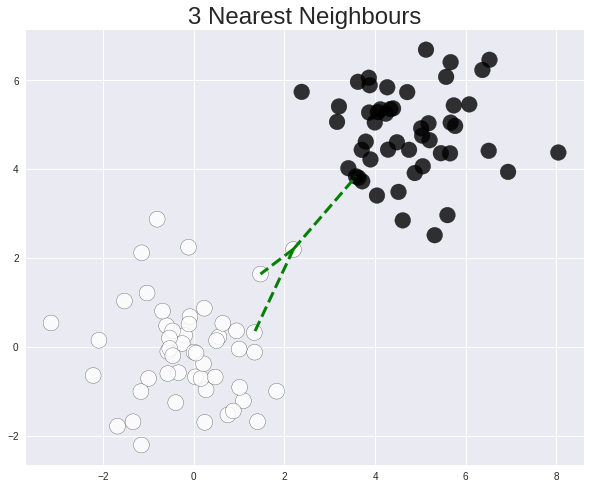

In [27]:
plt.figure(figsize=(10,8))
plt.grid(True)
plt.scatter(X[:,0], X[:, 1], marker='o', c=y,
            s=250, edgecolor='k', alpha=0.8)
plt.scatter(newExample[0], newExample[1], marker='o', c='white',
            s=250, edgecolor='k', alpha=0.8)
for xi in X[nearest_neighbours_indices]:
    plt.plot([newExample[0], xi[0]], [newExample[1],xi[1]], 'g--', linewidth=3)
plt.title('3 Nearest Neighbours', fontsize=24)
plt.show()

In [28]:
def draw_decision_boundary(model, axis_chart, num_points=201, opacity=0.05):
    tx = np.linspace(np.min(model._X[:, 0], axis=0)-2,
                     np.max(model._X[:, 0], axis=0)+2, num_points)
    ty = np.linspace(np.min(model._X[:, 1], axis=0)-2,
                     np.max(model._X[:, 1], axis=0)+2, num_points)
    xx, yy = np.meshgrid(tx, ty)
    grid_prediction = np.zeros(xx.shape)

    for i in range(num_points):
        for j in range(num_points):
            grid_prediction[i][j], _ = model.predict([xx[i][j], yy[i][j]])
    
    axis_chart.scatter(xx.ravel(), yy.ravel(),
                       c=grid_prediction.ravel(), alpha=opacity)

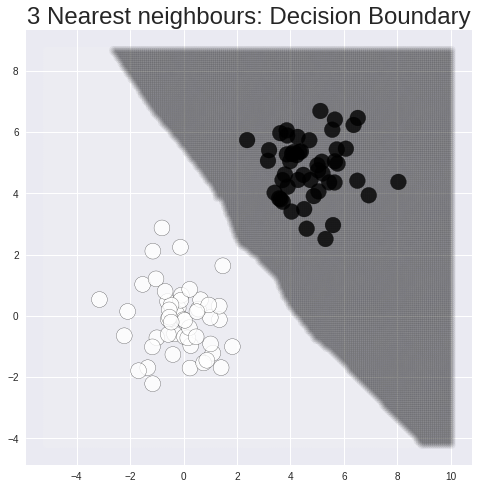

In [29]:
plt.figure(figsize=(8,8))
current_axis = plt.gca()
plt.grid(True)

draw_decision_boundary(model, current_axis)

plt.scatter(X[:, 0], X[:, 1], marker='o', c=y,
            s=250, edgecolor='k', alpha=0.8)

plt.title('3 Nearest neighbours: Decision Boundary', fontsize=24)
plt.show()

### Example 2: Complex decision boundary

Following is an example of binary class dataset of two spiral. As it is clear that KNN leads to a smooth and equidistant decision boundary.

In [30]:
def maketwospirals(num_points=1000, rotations=2, noise=.5):
    '''
    Parameters
    ----------
    num_points : Number of points to be generated per spiral
    rotations : how many times a spiral should rotate
    noise : noise factor

    Returns
    -------
    Coordinates and class vectors of the two spirals
    '''
    n = np.sqrt(np.random.rand(num_points, 1)) * rotations * (2*np.pi)
    rx = -np.cos(n)*n + np.random.rand(num_points, 1) * noise
    ry = np.sin(n)*n + np.random.rand(num_points, 1) * noise

    return (np.concatenate((np.hstack((rx, ry)),np.hstack((-rx,-ry))),axis=0),
            np.concatenate((np.zeros(num_points),np.ones(num_points)),axis=0))

X_spiral, y_spiral = maketwospirals()

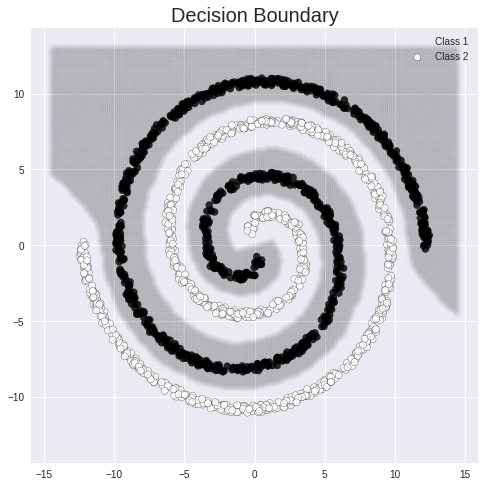

In [31]:
plt.figure(figsize=(8,8))
model = KNN(3)
model.fit(X_spiral, y_spiral)
plt.grid(True)

draw_decision_boundary(model, plt.gca(), opacity=0.02)

plt.scatter(X_spiral[:, 0], X_spiral[:, 1], marker='o', c=y_spiral,
            s=50, edgecolor='k', alpha=0.8)

plt.title('Decision Boundary', fontsize=20)
plt.legend(['Class 1', 'Class 2'])
plt.show()

### Regression

In [32]:
# to make this notebook's output stable across runs
np.random.seed(42)

# Create a dataset of 100 examples  with a single feature and a label.
# For this construction, we use the following three parameters:
w1 = 3
w0 = 4
n = 100
X = 2 * np.random.rand(n, )

# Obtain y = 4 + 3*x  + noise . Noise is randomly sampled.
y = w0 + w1 * X + np.random.randn(n, ) 

In [33]:
X = X.reshape(-1, 1)
y = y.reshape(-1, 1)

In [34]:
print('Shape of the training data feature matrix: ', X.shape)
print('Shape of label vector:', y.shape)

Shape of the training data feature matrix:  (100, 1)
Shape of label vector: (100, 1)


In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [36]:
print('Shape of the training feature matrix: ', X_train.shape)
print('Shape of the training label vector:', y_train.shape)

print('Shape of the testing feature matrix: ', X_test.shape)
print('Shape of the testing label vector:', y_test.shape)

Shape of the training feature matrix:  (80, 1)
Shape of the training label vector: (80, 1)
Shape of the testing feature matrix:  (20, 1)
Shape of the testing label vector: (20, 1)


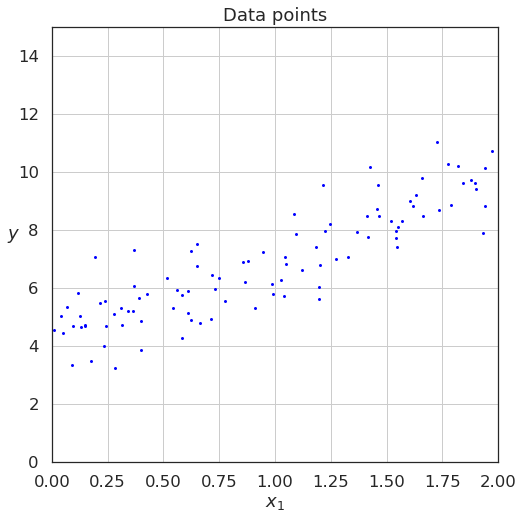

In [37]:
sns.set_style('white')
f = plt.figure(figsize=(8, 8))
sns.set_context('notebook', font_scale=1.5, rc={'lines.linewidth': 2.5})

plt.plot(X, y, 'b.')
plt.title('Data points')
plt.grid(True)
plt.xlabel('$x_1$', fontsize=18)
plt.ylabel('$y$', rotation=0, fontsize=18)
plt.axis([0, 2, 0, 15])
plt.show()

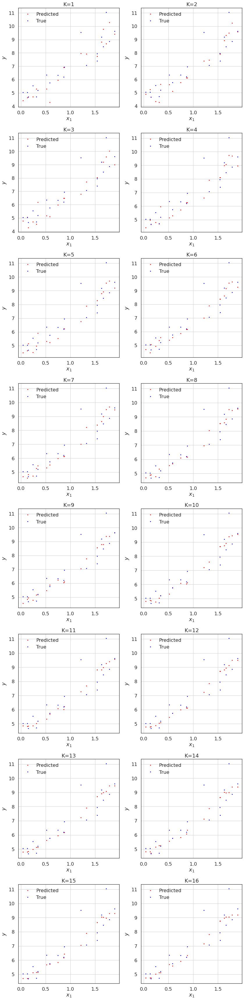

In [38]:
figure, axis =  plt.subplots(8, 2, figsize=(12, 48))
axis = axis.ravel()

error_list = []
for i in range(16):
    # Create a model object with specific value of K
    model = KNN(i+1, task_type='Regression')

    # fit the model
    model.fit(X_train, y_train)

    # create a vector to store the predictions
    y_test_predicted = np.zeros_like(y_test)

    # make predictions based on test set
    for j in range(X_test.shape[0]):
        # predict jth sample on the test set
        y_test_predicted[j], _ = model.predict(X_test[j, :])
    
    error_list.append(np.sum(np.power(y_test - y_test_predicted, 2)))

    # plot predictions
    axis[i].plot(X_test, y_test_predicted, 'r.')

    # plot ground truth
    axis[i].plot(X_test, y_test, 'b.')
    axis[i].legend(['Predicted', 'True'])

    # set title
    axis[i].set_title(f'K={i+1}')

    axis[i].grid(True)
    axis[i].set(xlabel='$x_1$', ylabel='$y$')

figure.tight_layout()
plt.show()

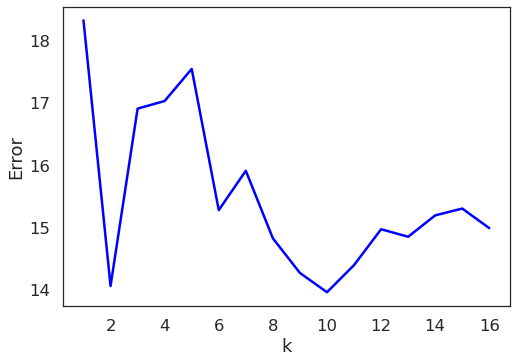

In [39]:
plt.plot(np.arange(len(error_list))+1, error_list, 'b-')
plt.xlabel('k')
plt.ylabel('Error')
plt.show()